# Basic three-objective sub-set selection optomization

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from mcsss import MultiCriteriaSubSetSolver
import matplotlib.pyplot as plt
import numpy as np

## Create a toy problem to solve

In [3]:
# create the actual problem to be solved
np.random.seed(1)
n_items = 50
x1 = np.random.uniform(0,1,n_items)
x2 = np.random.uniform(0,1,n_items)

obj1 = ('Max','random gaus 1',lambda x:np.sum(x1[x]))
obj2 = ('Max','random gaus 2',lambda x:np.sum(x2[x]))
obj3 = ('Max','std gaus 2',lambda x:np.std(x2[x]))

objectives = [
    obj1,
    obj2,
    obj3
]

mcsss = MultiCriteriaSubSetSolver(
    objective_functions=objectives,
    ids=[f'id_{i+1}' for i in range(n_items)],
)

## Solve

NSGA-II:   0%|          | 0.00/500 [00:00<?, ?generation/s]

Greedy Selection Init:   0%|          | 0/101 [00:00<?, ?it/s]

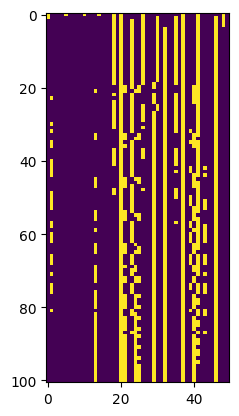

In [4]:
k = 10 # pick 50
res = mcsss.solve(n_max = k,pop_size=101,n_gens=500) # run the optomizer
#F = res.F * np.array([-1,-1]) # the optomizer does minimization, so to maximize we multiply by -1

In [5]:
from pymoo.decomposition.aasf import AASF
dm = AASF(eps=0.0, beta=5)


historical_x = []
historical_f = []
generation = []
for i,e in enumerate(res.history):
    for opt in e.opt:
        historical_x.append(opt.X)
        historical_f.append(opt.F)
        generation.append(i)

X = np.vstack(historical_x)
F = np.vstack(historical_f)
compromise = np.argmin(dm(F, weights=[0.33,0.33,0.33]))
F = F * np.array([-1,-1,-1])
X.shape,F.shape

((50380, 50), (50380, 3))

In [10]:

import pandas as pd
d={'generation':generation} # 'sid':range(len(generation))
for i,obj in enumerate(objectives):
        minmax,label,f  = obj
        d[label] = F[:,i]
fdf = pd.DataFrame(d)
fdf

,generation,random gaus 1,random gaus 2,std gaus 2
0,0,3.852685,4.917722,0.447092
1,0,4.636222,7.394644,0.365015
2,0,4.911523,8.182668,0.275015
3,0,5.581637,8.930740,0.063271
4,0,6.361433,8.773432,0.080856
...,...,...,...,...
50375,499,6.771796,7.775224,0.241980
50376,499,5.550332,5.441948,0.419378
50377,499,6.297482,6.118981,0.399097
50378,499,8.160049,4.897217,0.365148


In [11]:
import hiplot as hip
hip.Experiment().from_dataframe(fdf).display()

<IPython.core.display.Javascript object>

## Draw the solutions space

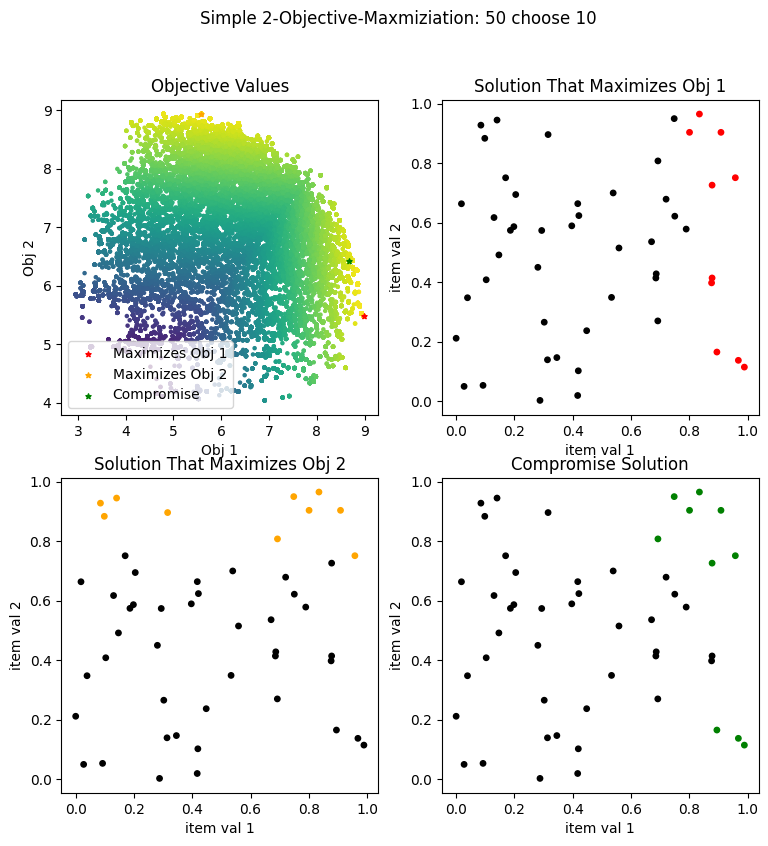

In [ ]:


fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2,figsize=(9, 9))

ax0.set_title('Objective Values')
ax0.scatter(F[:,0],F[:,1],s=5,c=dm(F, weights=[0.33,0.33,0.33]))

obj_1_max_i = np.argmax(F[:,0])
obj_2_max_i = np.argmax(F[:,1])

ax0.scatter(F[obj_1_max_i,0],F[obj_1_max_i,1],s=15,color='red',marker='*',label='Maximizes Obj 1')
ax0.scatter(F[obj_2_max_i,0],F[obj_2_max_i,1],s=15,color='orange',marker='*',label='Maximizes Obj 2')
ax0.scatter(F[compromise,0],F[compromise,1],s=15,color='green',marker='*',label='Compromise')
ax0.legend(loc='lower left')

ax0.set_xlabel('Obj 1')
ax0.set_ylabel('Obj 2')

obj1_colors = ['red' if x else 'k' for x in X[np.argmax(F[:,0]),:]]
ax1.scatter(x1,x2,s=15,c=obj1_colors)
ax1.set_xlabel('item val 1')
ax1.set_ylabel('item val 2')
ax1.set_title('Solution That Maximizes Obj 1')

obj2_colors = ['orange' if x else 'k' for x in X[np.argmax(F[:,1]),:]]
ax2.scatter(x1,x2,s=15,c=obj2_colors)
ax2.set_xlabel('item val 1')
ax2.set_ylabel('item val 2')
ax2.set_title('Solution That Maximizes Obj 2')

obj3_colors = ['green' if x else 'k' for x in X[compromise,:]]
ax3.scatter(x1,x2,s=15,c=obj3_colors)
ax3.set_xlabel('item val 1')
ax3.set_ylabel('item val 2')
ax3.set_title('Compromise Solution')

fig.suptitle(f'Simple 2-Objective-Maxmiziation: {n_items} choose {k}')
plt.show()